In [1]:
SCOPETYPE = 'CWNANO'
PLATFORM = 'CWNANO'
VERSION = 'HARDWARE'
SS_VER = 'SS_VER_1_1'

In [3]:
%run "Setup_Scripts/Setup_Generic.ipynb"

See https://chipwhisperer.readthedocs.io/en/latest/api.html#firmware-update


INFO: Found ChipWhisperer😍


In [25]:
scope.io.clkout = 3750000
scope.adc.clk_freq = 3750000
scope.adc.samples = 11010

In [4]:
print(scope)
print(target)

ChipWhisperer Nano Device
fw_version = 
    major = 0
    minor = 11
    debug = 0
io = 
    tio1         = None
    tio2         = None
    tio3         = None
    tio4         = high_z
    pdid         = True
    pdic         = False
    nrst         = True
    clkout       = 7500000.0
    cdc_settings = None
adc = 
    clk_src  = int
    clk_freq = 7500000.0
    samples  = 11010
glitch = 
    repeat     = 0
    ext_offset = 0

SimpleSerial Settings =
	output_len             = 16
	baud                   = 38400
	simpleserial_last_read = 
	simpleserial_last_sent = 
	


In [41]:
%%bash -s "$PLATFORM" "$SS_VER"
cd ../hardware/victims/firmware/elmo-aes
make PLATFORM=$1 CRYPTO_TARGET=NONE SS_VER=$2

rm -f -- elmo-aes-CWNANO.hex
rm -f -- elmo-aes-CWNANO.eep
rm -f -- elmo-aes-CWNANO.cof
rm -f -- elmo-aes-CWNANO.elf
rm -f -- elmo-aes-CWNANO.map
rm -f -- elmo-aes-CWNANO.sym
rm -f -- elmo-aes-CWNANO.lss
rm -f -- objdir/*.o
rm -f -- objdir/*.lst
rm -f -- byte_mask_aes.s simple.s random.s main.s simpleserial.s stm32f0_hal_nano.s stm32f0_hal_lowlevel.s
rm -f -- byte_mask_aes.d simple.d random.d main.d simpleserial.d stm32f0_hal_nano.d stm32f0_hal_lowlevel.d
rm -f -- byte_mask_aes.i simple.i random.i main.i simpleserial.i stm32f0_hal_nano.i stm32f0_hal_lowlevel.i
mkdir -p .dep
echo .
.
echo Welcome to another exciting ChipWhisperer target build!!
Welcome to another exciting ChipWhisperer target build!!
arm-none-eabi-gcc --version
arm-none-eabi-gcc (Arch Repository) 11.2.0
Copyright (C) 2021 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.

mkdir -p objdir 
ec

In file included from byte_mask_aes.c:28:
byte_mask_aes.h:42:1: warning: function declaration isn't a prototype [-Wstrict-prototypes]
   42 | void init_masking();
      | ^~~~
byte_mask_aes.h:45:1: warning: function declaration isn't a prototype [-Wstrict-prototypes]
   45 | void init_masked_round_keys();
      | ^~~~
byte_mask_aes.h:46:1: warning: function declaration isn't a prototype [-Wstrict-prototypes]
   46 | void calcInvSbox_masked();
      | ^~~~
byte_mask_aes.h:47:1: warning: function declaration isn't a prototype [-Wstrict-prototypes]
   47 | void calcMixColMask();
      | ^~~~
byte_mask_aes.h:49:1: warning: function declaration isn't a prototype [-Wstrict-prototypes]
   49 | void copy_key();
      | ^~~~
byte_mask_aes.c:302:6: warning: function declaration isn't a prototype [-Wstrict-prototypes]
  302 | void calcMixColMask(){
      |      ^~~~~~~~~~~~~~
byte_mask_aes.c:317:6: warning: function declaration isn't a prototype [-Wstrict-prototypes]
  317 | void calcSbox_masked(

In [42]:
cw.program_target(scope, cw.programmers.STM32FProgrammer, "../hardware/victims/firmware/elmo-aes/elmo-aes-CWNANO.hex")

Detected known STMF32: STM32F03xx4/03xx6
Extended erase (0x44), this can take ten seconds or more
Attempting to program 5815 bytes at 0x8000000
STM32F Programming flash...
STM32F Reading flash...
Verified flash OK, 5815 bytes


In [22]:
reset_target(scope)

In [47]:
from tqdm.notebook import tnrange
import numpy as np
import time

trace_array = []

reset_target(scope)

N = 100
for i in tnrange(N, desc='Capturing traces'):
    target.flush()
    scope.arm()
    ret = scope.capture()
    if ret:
        print("Target timed out!")
        continue
    
    trace_array.append(scope.get_last_trace())

Capturing traces:   0%|          | 0/100 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


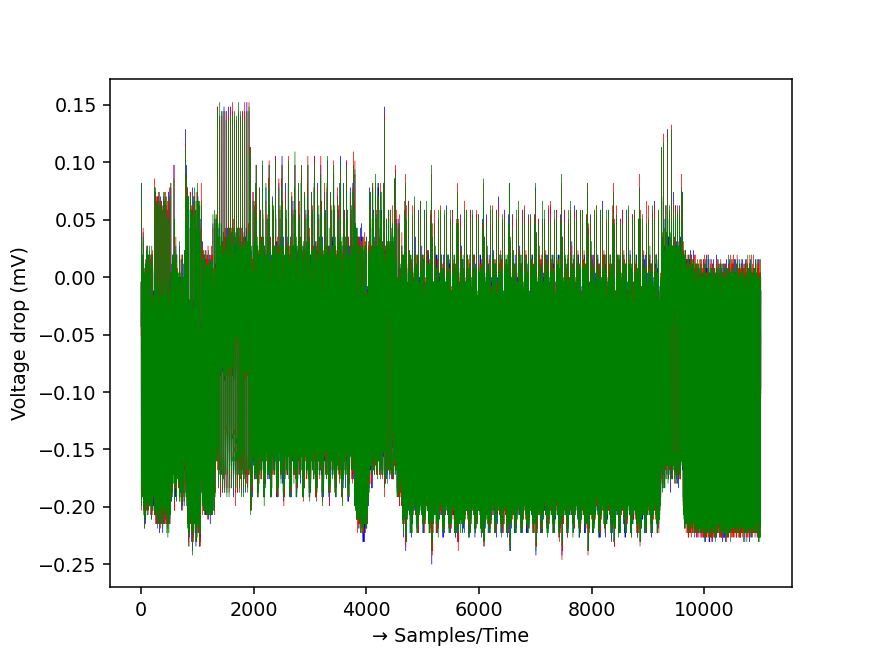

In [48]:
%matplotlib notebook
import matplotlib.pylab as plt

plt.figure(dpi=125)
plt.xlabel("→ Samples/Time")
plt.ylabel("Voltage drop (mV)")
plt.plot(trace_array[0][:], 'b', linewidth=0.2)
plt.plot(trace_array[1][:], 'r', linewidth=0.2)
plt.plot(trace_array[2][:], 'g', linewidth=0.2)
plt.show()

<IPython.core.display.Javascript object>


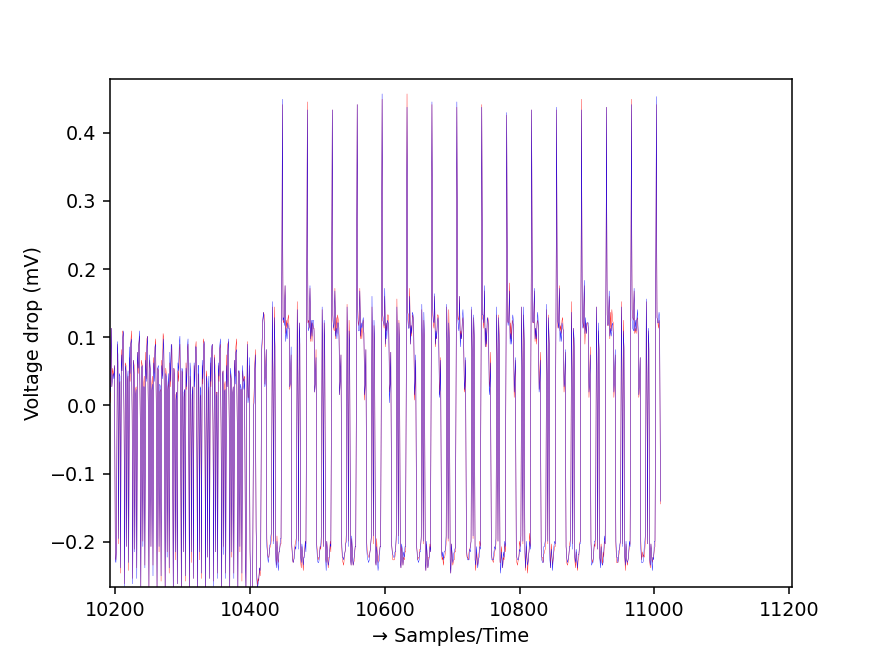

In [81]:
%matplotlib notebook
import matplotlib.pylab as plt

plt.figure(dpi=125)
plt.xlabel("→ Samples/Time")
plt.ylabel("Voltage drop (mV)")
plt.plot(trace_array[0][:11010], 'r', linewidth=0.2)
plt.plot(trace_array[1][:11010], 'b', linewidth=0.2)
plt.show()

In [95]:
random_traces = trace_array

In [96]:
print(len(fixed_traces))
print(len(random_traces))

500
500


In [49]:
import numpy as np
mean1 = np.mean(fixed_traces, axis=0)
mean2 = np.mean(random_traces, axis=0)
cw.plot(mean2) * cw.plot(mean1)

NameError: name 'fixed_traces' is not defined

In [98]:
from scipy.stats import ttest_ind
t_val = ttest_ind(fixed_traces, random_traces, axis=0, equal_var=False)[0]
cw.plot(t_val)

:Curve   [x]   (y)

In [110]:
import holoviews as hv
N = len(fixed_traces)
t_val = [ttest_ind(fixed_traces[:N//2], random_traces[:N//2], axis=0, equal_var=False)[0], 
         ttest_ind(fixed_traces[N//2:], random_traces[N//2:], axis=0, equal_var=False)[0]]

cv = cw.plot(t_val[0]) * cw.plot(t_val[1])
cv *= cw.plot([4.5]*len(fixed_traces[0]))
cv *= cw.plot([-4.5]*len(fixed_traces[0]))
cv

:Overlay
   .Curve.I   :Curve   [x]   (y)
   .Curve.II  :Curve   [x]   (y)
   .Curve.III :Curve   [x]   (y)
   .Curve.IV  :Curve   [x]   (y)

In [80]:
with open('aes-masked.npy', 'wb') as f:
    np.save(f, trace_array)

In [18]:
scope.dis()
target.dis()